Clustering MNIST By Expectation-Maximization

1. Load data

In [62]:
import os
import numpy as np
# set names to the paths because they're too long
data_path = 'c:\\Users\\VINH\\Downloads'
# train path
train_images_path = os.path.join(data_path, 'train-images-idx3-ubyte.gz')
train_labels_path = os.path.join(data_path, 'train-labels-idx1-ubyte.gz')
# test path
test_images_path = os.path.join(data_path, 't10k-images-idx3-ubyte.gz')
test_labels_path = os.path.join(data_path, 't10k-labels-idx1-ubyte.gz')

In [63]:
def get_mnist_data(images_path, labels_path, num_images, shuffle=False, _is=True, image_size=28):
  """
  This shuffle param is active when .gz is downloaded at:
  - 'http://yann.lecun.com/exdb/mnist/'
  - This function return random num_images in 60000 or 10000
  """
  # read data
  import gzip # to decompress gz (zip) file
  # open file training to read training data
  f_images = gzip.open(images_path,'r')
  # skip 16 first bytes because these are not data, only header infor
  f_images.read(16)
  # general: read num_images data samples if this parameter is set;
  # if not, read all (60000 training or 10000 test)
  real_num = num_images if not shuffle else (60000 if _is else 10000)
  # read all data to buf_images (28x28xreal_num)
  buf_images = f_images.read(image_size * image_size * real_num)
  # images
  images = np.frombuffer(buf_images, dtype=np.uint8).astype(np.float32)
  images = images.reshape(real_num, image_size, image_size,)
  # Read labels
  f_labels = gzip.open(labels_path,'r')
  f_labels.read(8)
  labels = np.zeros((real_num)).astype(np.int64)
  # rearrange to correspond the images and labels
  for i in range(0, real_num):
    buf_labels = f_labels.read(1)
    labels[i] = np.frombuffer(buf_labels, dtype=np.uint8).astype(np.int64)
  # shuffle to get random images data
  if shuffle is True:
    rand_id = np.random.randint(real_num, size=num_images)
    images = images[rand_id, :]
    labels = labels[rand_id,]
  # change images data to type of vector 28x28 dimentional
  images = images.reshape(num_images, image_size * image_size)
  return images, labels

In [64]:
# chia train test
train_images, train_labels = get_mnist_data(train_images_path, train_labels_path, 60000, shuffle=False)
test_images, test_labels = get_mnist_data(test_images_path, test_labels_path, 10000, _is=False, shuffle=False)
print(train_images.shape, train_labels.shape)
print(test_images.shape, test_labels.shape)

(60000, 784) (60000,)
(10000, 784) (10000,)


2. Check data

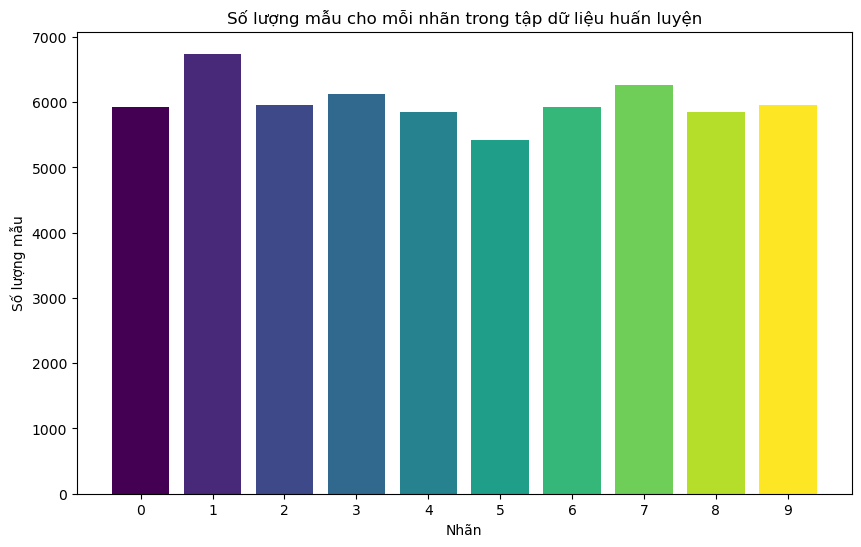

In [65]:
import matplotlib.pyplot as plt

label_counts = np.bincount(train_labels)
colors = plt.cm.viridis(np.linspace(0, 1, len(label_counts)))
labels = np.arange(len(label_counts))

plt.figure(figsize=(10, 6))
plt.bar(labels, label_counts, color=colors)
plt.xlabel('Nhãn')
plt.ylabel('Số lượng mẫu')
plt.title('Số lượng mẫu cho mỗi nhãn trong tập dữ liệu huấn luyện')

plt.xticks(labels)

plt.show()

In [66]:
# Áp dụng chuẩn hóa cho cả dữ liệu train và test
from sklearn.preprocessing import StandardScaler
train_images = StandardScaler().fit_transform(train_images)
test_images = StandardScaler().fit_transform(test_images)

3. Clustering by EM

3.1. Clustering with original data and Visual in 2D

Adjusted Rand Index (original): 0.22745694119870885


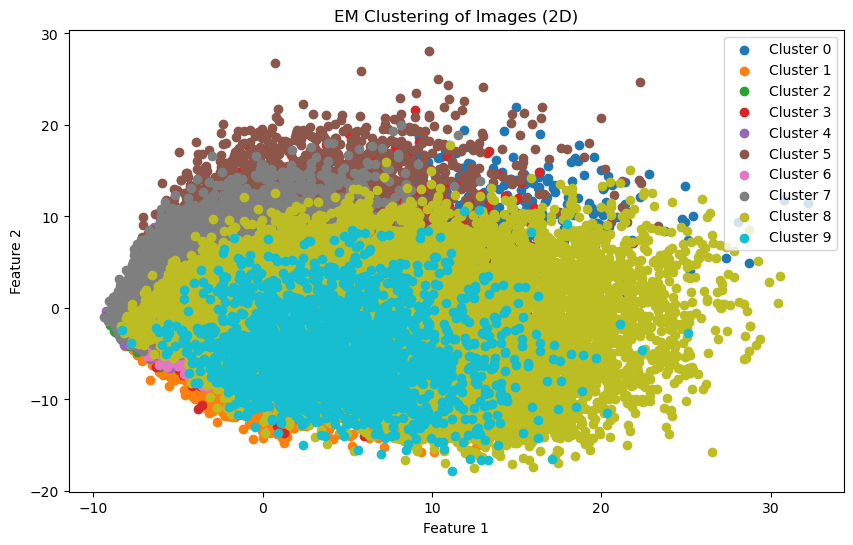

In [67]:
import numpy as np
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Sử dụng GaussianMixture (thuật toán EM) để gom thành 10 cụm
gmm = GaussianMixture(n_components=10, covariance_type='full', random_state=0)
gmm.fit(train_images)

# Tính toán Adjusted Rand Index cho dữ liệu gốc
ari_orig = adjusted_rand_score(train_labels, gmm.predict(train_images))
print("Adjusted Rand Index (original):", ari_orig)

# Giảm chiều dữ liệu xuống còn 2 chiều để trực quan hóa
pca = PCA(n_components=2)
transformed = pca.fit_transform(train_images)

# Hiển thị trực quan và đánh dấu các cụm
plt.figure(figsize=(10, 6))

for i in range(n_clusters):
    cluster_points = transformed[gmm.predict(train_images) == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}')

plt.title('EM Clustering of Images (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

3.2. Clustering with original data and Visual in 3D

In [68]:
import numpy as np
from sklearn.mixture import GaussianMixture
import plotly.graph_objs as go
from sklearn.decomposition import PCA

# Chú ý: cần phải có sự chuyển đổi dữ liệu ảnh thành 1D vector trước khi sử dụng EM

# Sử dụng EM để gom thành 10 cụm
gmm = GaussianMixture(n_components=10, covariance_type='full', random_state=0)
gmm.fit(train_images)

# Giảm chiều dữ liệu xuống còn 3 chiều để trực quan hóa
pca = PCA(n_components=3)
transformed = pca.fit_transform(train_images)

# Tạo biểu đồ 3D có thể xoay được
fig = go.Figure()

for i in range(n_clusters):
    cluster_points = transformed[gmm.predict(train_images) == i]
    fig.add_trace(go.Scatter3d(
        x=cluster_points[:, 0],
        y=cluster_points[:, 1],
        z=cluster_points[:, 2],
        mode='markers',
        marker=dict(size=4),
        name=f'Cluster {i}'
    ))

fig.update_layout(
    title='EM Clustering of Images (3D)',
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Feature 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

fig.show()

3.3 Clustering with dimension-reduced data using PCA

3.3.1 In 150 dimensions / Visual in 2D

Adjusted Rand Index (PCA): 0.20611700717614573


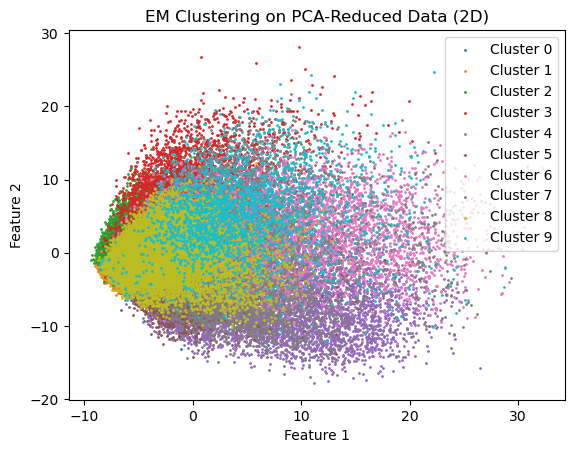

In [69]:
import os
import numpy as np
import gzip
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score

# Giảm chiều dữ liệu xuống còn 150 chiều với PCA
pca_150 = PCA(n_components=150)
train_images_pca = pca_150.fit_transform(train_images)

# Sử dụng Gaussian Mixture Model để gom thành 10 cụm trên dữ liệu đã giảm chiều
gmm_pca = GaussianMixture(n_components=10, covariance_type='full', random_state=0)
gmm_pca.fit(train_images_pca)

# Tính toán Adjusted Rand Index cho dữ liệu đã giảm chiều
ari_pca = adjusted_rand_score(train_labels, gmm_pca.predict(train_images_pca))
print("Adjusted Rand Index (PCA):", ari_pca)

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu đã giảm chiều
for i in range(n_clusters):
    cluster_points = train_images_pca[gmm_pca.predict(train_images_pca) == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', s=1)
plt.title('EM Clustering on PCA-Reduced Data (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

plt.show()

3.3.2 In 2 dimension / Visual in 2D

Adjusted Rand Index (PCA): 0.13907369577371645


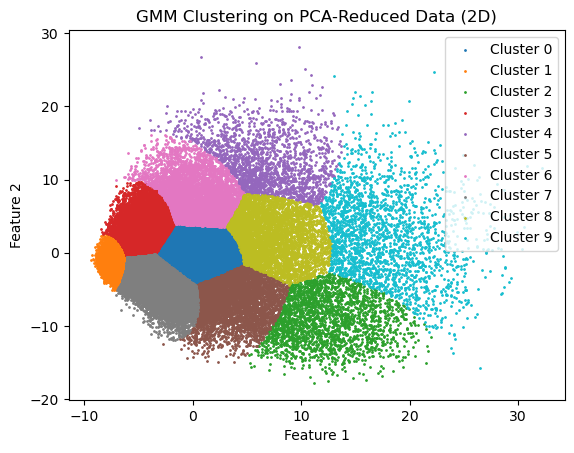

In [70]:
import os
import numpy as np
import gzip
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score

# Giảm chiều dữ liệu xuống còn 2 chiều với PCA
pca_2 = PCA(n_components=2)
train_images_pca = pca_2.fit_transform(train_images)

# Sử dụng GMM để gom thành 10 cụm trên dữ liệu đã giảm chiều
gmm_pca = GaussianMixture(n_components=10, covariance_type='full', random_state=0)
gmm_pca.fit(train_images_pca)

# Tính toán thước đo cho dữ liệu đã giảm chiều
ari_pca = adjusted_rand_score(train_labels, gmm_pca.predict(train_images_pca))
print("Adjusted Rand Index (PCA):", ari_pca)

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu đã giảm chiều
for i in range(n_clusters):
    cluster_points = train_images_pca[gmm_pca.predict(train_images_pca) == i]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {i}', s=1)
plt.title('GMM Clustering on PCA-Reduced Data (2D)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

plt.show()

3.3.3 In 150 dimensions / Visual in 3D

In [71]:
import os
import numpy as np
import gzip
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score

# Giảm chiều dữ liệu xuống còn 150 chiều với PCA
pca_150 = PCA(n_components=150)
train_images_pca = pca_150.fit_transform(train_images)

# Sử dụng GMM để gom thành 10 cụm trên dữ liệu đã giảm chiều
gmm_pca = GaussianMixture(n_components=10, covariance_type='full', random_state=42)
gmm_pca.fit(train_images_pca)
labels_pca = gmm_pca.predict(train_images_pca)

# Tính toán thước đo cho dữ liệu đã giảm chiều
ari_pca = adjusted_rand_score(train_labels, labels_pca)
print("Adjusted Rand Index (PCA):", ari_pca)

# Hiển thị trực quan và đánh dấu các cụm trên dữ liệu đã giảm chiều trong không gian 3 chiều
fig_pca = go.Figure()
for i in range(n_clusters):
    cluster_points = train_images_pca[labels_pca == i]
    fig_pca.add_trace(go.Scatter3d(
        x=cluster_points[:, 0],
        y=cluster_points[:, 1],
        z=cluster_points[:, 2],
        mode='markers',
        marker=dict(size=2),
        name=f'Cluster {i}'
    ))

fig_pca.update_layout(
    title='GMM Clustering on PCA-Reduced Data (3D)',
    scene=dict(
        xaxis_title='Feature 1',
        yaxis_title='Feature 2',
        zaxis_title='Feature 3'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)
fig_pca.show()

Adjusted Rand Index (PCA): 0.22799605823652014
